In [ ]:
pip install opencv-python fer

In [ ]:
!pip install pretty_midi pyfluidsynth

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 45.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.6/54.6 kB 3.7 MB/s eta 0:00:00
  Created wheel for pretty_midi: filename=pretty_midi-0.2.10-py3-none-any.whl size=5592286 sha256=3cc9dc82e04f883f2b181e33a85ea4d5ab9384a71489ec9fa41df7ef78763049
  Stored in directory: /root/.cache/pip/wheels/e6/95/ac/15ceaeb2823b04d8e638fd1495357adb8d26c00ccac9d7782e
Successfully built pretty_midi


In [ ]:
!apt-get install -y fluidsynth
!apt-get install -y soundfont-general-midi


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fluid-soundfont-gm libevdev2 libfluidsynth3 libgudev-1.0-0 libinput-bin
  libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a libqt5dbus5
  libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5 libwacom-bin
  libwacom-common libwacom9 libxcb-icccm4 libxcb-image0 libxcb-keysyms1
  libxcb-render-util0 libxcb-util1 libxcb-xinerama0 libxcb-xinput0 libxcb-xkb1
  libxkbcommon-x11-0 qsynth qt5-gtk-platformtheme qttranslations5-l10n
  timgm6mb-soundfont
Suggested packages:
  fluid-soundfont-gs qt5-image-formats-plugins qtwayland5 jackd
The following NEW packages will be installed:
  fluid-soundfont-gm fluidsynth libevdev2 libfluidsynth3 libgudev-1.0-0
  libinput-bin libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a
  libqt5dbus5 libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5 libwacom-bin
  libwacom-common libwacom9 libx

In [ ]:
import pretty_midi
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import random
import pickle
import os

class EmotionMusicGenerator:
    def __init__(self):
        # Map emotions to musical characteristics
        self.emotion_settings = {
            'happy': {'scale': [0, 2, 4, 5, 7, 9, 11], 'tempo': 120, 'base_note': 60, 'rhythm': 'upbeat'},
            'sad': {'scale': [0, 2, 3, 5, 7, 8, 10], 'tempo': 65, 'base_note': 57, 'rhythm': 'slow'},
            'angry': {'scale': [0, 1, 4, 5, 7, 8, 10], 'tempo': 140, 'base_note': 55, 'rhythm': 'intense'},
            'surprise': {'scale': [0, 2, 5, 7, 9], 'tempo': 110, 'base_note': 62, 'rhythm': 'varied'},
            'fear': {'scale': [0, 1, 3, 6, 7, 8, 10], 'tempo': 80, 'base_note': 59, 'rhythm': 'tense'},
            'disgust': {'scale': [0, 1, 4, 6, 8, 9], 'tempo': 85, 'base_note': 58, 'rhythm': 'dissonant'},
            'neutral': {'scale': [0, 2, 4, 5, 7, 9, 11], 'tempo': 95, 'base_note': 60, 'rhythm': 'balanced'}
        }

        # LSTM model parameters
        self.seq_length = 16
        self.model = self._build_model()

        # Seed patterns for different emotions (can be expanded)
        self.seed_patterns = {
            'happy': [0, 4, 7, 4, 0, 4, 7, 9, 7, 4, 0, 4, 7, 4, 2, 5],
            'sad': [0, -3, -5, -3, 0, -3, -5, -7, -5, -3, 0, -3, -5, -3, -2, -5],
            'angry': [0, 3, 0, 7, 0, 3, 0, 7, 0, 3, 0, 10, 7, 3, 0, -2],
            'surprise': [0, 7, 4, 7, 0, 4, 7, 9, 7, 4, 0, 4, 7, 4, 2, 5],
            'fear': [-12, -8, -5, -8, -12, -8, -5, -3, -5, -8, -12, -8, -5, -8, -10, -7],
            'disgust': [0, 1, 6, 1, 0, 1, 6, 8, 6, 1, 0, 1, 6, 1, -1, 4],
            'neutral': [0, 2, 4, 7, 4, 2, 0, 2, 4, 7, 9, 7, 4, 2, 0, -2]
        }

    def _build_model(self):
        """Build the LSTM model for note sequence generation"""
        model = Sequential([
            LSTM(128, input_shape=(self.seq_length, 1), return_sequences=True),
            Dropout(0.2),
            LSTM(128, return_sequences=False),
            Dropout(0.2),
            Dense(64, activation='relu'),
            Dense(1)
        ])
        model.compile(optimizer='adam', loss='mse')
        return model

    def train_model(self, emotion):
        """Train the model on patterns suitable for the given emotion"""
        # Create training data for the emotion
        seed = self.seed_patterns.get(emotion, self.seed_patterns['neutral'])

        # Generate more training data by adding variations
        training_data = []
        for _ in range(50):  # Generate 50 variations
            variation = np.array(seed) + np.random.randint(-2, 3, size=len(seed))
            training_data.append(variation)

        # Prepare sequences for training
        X, y = [], []
        for sequence in training_data:
            for i in range(len(sequence) - self.seq_length):
                X.append(sequence[i:i+self.seq_length])
                y.append(sequence[i+self.seq_length])

        X = np.array(X).reshape(-1, self.seq_length, 1)
        y = np.array(y)

        # Train the model
        self.model.fit(X, y, epochs=10, batch_size=32, verbose=0)

    def generate_sequence(self, emotion, length=64):
        """Generate a note sequence based on emotion"""
        # Train the model if it hasn't been trained for this emotion
        self.train_model(emotion)

        # Get the seed pattern for the emotion
        seed = self.seed_patterns.get(emotion, self.seed_patterns['neutral'])
        seed = seed[:self.seq_length]

        # Generate the sequence
        generated = list(seed)
        seed_array = np.array(seed).reshape(1, self.seq_length, 1)

        for _ in range(length - self.seq_length):
            prediction = self.model.predict(seed_array, verbose=0)[0][0]
            # Add some randomness for variety
            prediction += np.random.normal(0, 1)
            generated.append(prediction)

            # Update seed for next prediction
            seed_array = np.array(generated[-self.seq_length:]).reshape(1, self.seq_length, 1)

        # Round to integers for MIDI notes
        return [int(round(x)) for x in generated]

    def create_rhythm_pattern(self, emotion, length=16):
        """Create a rhythm pattern based on emotion"""
        rhythm_type = self.emotion_settings[emotion]['rhythm']

        if rhythm_type == 'upbeat':
            # More frequent notes, energetic
            return [0.25 if i % 2 == 0 else 0.5 for i in range(length)]
        elif rhythm_type == 'slow':
            # Longer, sustained notes
            return [0.5 if i % 2 == 0 else 1.0 for i in range(length)]
        elif rhythm_type == 'intense':
            # Aggressive, sharp rhythm
            return [0.125 if i % 4 == 0 else 0.25 for i in range(length)]
        elif rhythm_type == 'varied':
            # Unpredictable pattern
            return [random.choice([0.125, 0.25, 0.5, 0.75]) for _ in range(length)]
        elif rhythm_type == 'tense':
            # Irregular, unsettling
            return [0.25 if i % 3 == 0 else 0.5 for i in range(length)]
        elif rhythm_type == 'dissonant':
            # Uncomfortable rhythm
            return [0.33 if i % 3 == 0 else 0.25 for i in range(length)]
        else:  # balanced
            # Regular, pleasant rhythm
            return [0.5 for _ in range(length)]

    def generate_music(self, emotion, output_path='emotion_music.mid', duration=30):
        """Generate music based on detected emotion"""
        # Default to neutral if emotion not found
        if emotion not in self.emotion_settings:
            emotion = 'neutral'

        settings = self.emotion_settings[emotion]
        base_note = settings['base_note']
        scale = settings['scale']
        tempo = settings['tempo']

        # Generate a sequence of note positions in the scale
        note_positions = self.generate_sequence(emotion, length=int(duration * 4))

        # Create rhythm pattern and expand to match the sequence length
        base_rhythm = self.create_rhythm_pattern(emotion)
        rhythm = []
        for _ in range(len(note_positions) // len(base_rhythm) + 1):
            rhythm.extend(base_rhythm)
        rhythm = rhythm[:len(note_positions)]

        # Create a MIDI file
        midi = pretty_midi.PrettyMIDI(initial_tempo=tempo)
        piano = pretty_midi.Instrument(program=0)  # Piano

        # Add a baseline/chord progression
        chord_instrument = pretty_midi.Instrument(program=48)  # String ensemble

        # Convert note positions to actual MIDI notes using the scale
        current_time = 0
        for i, pos in enumerate(note_positions):
            # Convert position in sequence to note in scale
            scale_index = pos % len(scale)
            octave_shift = pos // len(scale)
            note_value = base_note + scale[scale_index] + (octave_shift * 12)

            # Keep notes in reasonable range
            while note_value > 96:  # Too high
                note_value -= 12
            while note_value < 36:  # Too low
                note_value += 12

            # Create note
            note = pretty_midi.Note(
                velocity=max(60, min(100, 75 + pos % 30)),  # Dynamics between 60-100
                pitch=note_value,
                start=current_time,
                end=current_time + rhythm[i]
            )

            piano.notes.append(note)
            current_time += rhythm[i]

            # Add occasional chords
            if i % 8 == 0:
                # Root position triad
                chord_notes = [0, 2, 4]  # Root, third, fifth
                for chord_note in chord_notes:
                    scale_idx = (scale_index + chord_note) % len(scale)
                    chord_value = base_note + scale[scale_idx] + (octave_shift * 12)

                    # Keep in reasonable range
                    while chord_value > 84:
                        chord_value -= 12

                    chord_note = pretty_midi.Note(
                        velocity=50,
                        pitch=chord_value,
                        start=current_time - rhythm[i],
                        end=current_time + (rhythm[i] * 2)
                    )
                    chord_instrument.notes.append(chord_note)

        # Add instruments to MIDI file
        midi.instruments.append(piano)
        midi.instruments.append(chord_instrument)

        # Save the file
        midi.write(output_path)
        return output_path

    def save_model(self, path="emotion_music_model"):
        """Save the model for future use"""
        self.model.save(f"{path}_model.h5")
        with open(f"{path}_seed_patterns.pkl", 'wb') as f:
            pickle.dump(self.seed_patterns, f)

    def load_model(self, path="emotion_music_model"):
        """Load a previously saved model"""
        if os.path.exists(f"{path}_model.h5"):
            self.model = tf.keras.models.load_model(f"{path}_model.h5")
            with open(f"{path}_seed_patterns.pkl", 'rb') as f:
                self.seed_patterns = pickle.load(f)
            return True
        return False

In [ ]:
# Create the lstm_emotion_music.py file
with open('lstm_emotion_music.py', 'w') as f:
    f.write('''import pretty_midi
import numpy as np
import pretty_midi
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.losses import MeanSquaredError  # Import the loss function directly
import random
import pickle
import os

class EmotionMusicGenerator:
    def __init__(self):
        # Map emotions to musical characteristics
        self.emotion_settings = {
            'happy': {'scale': [0, 2, 4, 5, 7, 9, 11], 'tempo': 120, 'base_note': 60, 'rhythm': 'upbeat'},
            'sad': {'scale': [0, 2, 3, 5, 7, 8, 10], 'tempo': 65, 'base_note': 57, 'rhythm': 'slow'},
            'angry': {'scale': [0, 1, 4, 5, 7, 8, 10], 'tempo': 140, 'base_note': 55, 'rhythm': 'intense'},
            'surprise': {'scale': [0, 2, 5, 7, 9], 'tempo': 110, 'base_note': 62, 'rhythm': 'varied'},
            'fear': {'scale': [0, 1, 3, 6, 7, 8, 10], 'tempo': 80, 'base_note': 59, 'rhythm': 'tense'},
            'disgust': {'scale': [0, 1, 4, 6, 8, 9], 'tempo': 85, 'base_note': 58, 'rhythm': 'dissonant'},
            'neutral': {'scale': [0, 2, 4, 5, 7, 9, 11], 'tempo': 95, 'base_note': 60, 'rhythm': 'balanced'}
        }

        # LSTM model parameters
        self.seq_length = 16
        self.model = self._build_model()

        # Seed patterns for different emotions (can be expanded)
        self.seed_patterns = {
            'happy': [0, 4, 7, 4, 0, 4, 7, 9, 7, 4, 0, 4, 7, 4, 2, 5],
            'sad': [0, -3, -5, -3, 0, -3, -5, -7, -5, -3, 0, -3, -5, -3, -2, -5],
            'angry': [0, 3, 0, 7, 0, 3, 0, 7, 0, 3, 0, 10, 7, 3, 0, -2],
            'surprise': [0, 7, 4, 7, 0, 4, 7, 9, 7, 4, 0, 4, 7, 4, 2, 5],
            'fear': [-12, -8, -5, -8, -12, -8, -5, -3, -5, -8, -12, -8, -5, -8, -10, -7],
            'disgust': [0, 1, 6, 1, 0, 1, 6, 8, 6, 1, 0, 1, 6, 1, -1, 4],
            'neutral': [0, 2, 4, 7, 4, 2, 0, 2, 4, 7, 9, 7, 4, 2, 0, -2]
        }

    def _build_model(self):
        """Build the LSTM model for note sequence generation"""
        model = Sequential([
            LSTM(128, input_shape=(self.seq_length, 1), return_sequences=True),
            Dropout(0.2),
            LSTM(128, return_sequences=False),
            Dropout(0.2),
            Dense(64, activation='relu'),
            Dense(1)
        ])
        model.compile(optimizer='adam', loss='mse')
        return model

    def train_model(self, emotion):
        """Train the model on patterns suitable for the given emotion"""
        # Create training data for the emotion
        seed = self.seed_patterns.get(emotion, self.seed_patterns['neutral'])

        # Generate more training data by adding variations
        training_data = []
        for _ in range(50):  # Generate 50 variations
            variation = np.array(seed) + np.random.randint(-2, 3, size=len(seed))
            training_data.append(variation)

        # Prepare sequences for training
        X, y = [], []
        for sequence in training_data:
            for i in range(len(sequence) - self.seq_length):
                X.append(sequence[i:i+self.seq_length])
                y.append(sequence[i+self.seq_length])

        X = np.array(X).reshape(-1, self.seq_length, 1)
        y = np.array(y)

        # Train the model
        self.model.fit(X, y, epochs=10, batch_size=32, verbose=0)

    def generate_sequence(self, emotion, length=64):
        """Generate a note sequence based on emotion"""
        # Train the model if it hasn't been trained for this emotion
        self.train_model(emotion)

        # Get the seed pattern for the emotion
        seed = self.seed_patterns.get(emotion, self.seed_patterns['neutral'])
        seed = seed[:self.seq_length]

        # Generate the sequence
        generated = list(seed)
        seed_array = np.array(seed).reshape(1, self.seq_length, 1)

        for _ in range(length - self.seq_length):
            prediction = self.model.predict(seed_array, verbose=0)[0][0]
            # Add some randomness for variety
            prediction += np.random.normal(0, 1)
            generated.append(prediction)

            # Update seed for next prediction
            seed_array = np.array(generated[-self.seq_length:]).reshape(1, self.seq_length, 1)

        # Round to integers for MIDI notes
        return [int(round(x)) for x in generated]

    def create_rhythm_pattern(self, emotion, length=16):
        """Create a rhythm pattern based on emotion"""
        rhythm_type = self.emotion_settings[emotion]['rhythm']

        if rhythm_type == 'upbeat':
            # More frequent notes, energetic
            return [0.25 if i % 2 == 0 else 0.5 for i in range(length)]
        elif rhythm_type == 'slow':
            # Longer, sustained notes
            return [0.5 if i % 2 == 0 else 1.0 for i in range(length)]
        elif rhythm_type == 'intense':
            # Aggressive, sharp rhythm
            return [0.125 if i % 4 == 0 else 0.25 for i in range(length)]
        elif rhythm_type == 'varied':
            # Unpredictable pattern
            return [random.choice([0.125, 0.25, 0.5, 0.75]) for _ in range(length)]
        elif rhythm_type == 'tense':
            # Irregular, unsettling
            return [0.25 if i % 3 == 0 else 0.5 for i in range(length)]
        elif rhythm_type == 'dissonant':
            # Uncomfortable rhythm
            return [0.33 if i % 3 == 0 else 0.25 for i in range(length)]
        else:  # balanced
            # Regular, pleasant rhythm
            return [0.5 for _ in range(length)]

    def generate_music(self, emotion, output_path='emotion_music.mid', duration=30):
        """Generate music based on detected emotion"""
        # Default to neutral if emotion not found
        if emotion not in self.emotion_settings:
            emotion = 'neutral'

        settings = self.emotion_settings[emotion]
        base_note = settings['base_note']
        scale = settings['scale']
        tempo = settings['tempo']

        # Generate a sequence of note positions in the scale
        note_positions = self.generate_sequence(emotion, length=int(duration * 4))

        # Create rhythm pattern and expand to match the sequence length
        base_rhythm = self.create_rhythm_pattern(emotion)
        rhythm = []
        for _ in range(len(note_positions) // len(base_rhythm) + 1):
            rhythm.extend(base_rhythm)
        rhythm = rhythm[:len(note_positions)]

        # Create a MIDI file
        midi = pretty_midi.PrettyMIDI(initial_tempo=tempo)
        piano = pretty_midi.Instrument(program=0)  # Piano

        # Add a baseline/chord progression
        chord_instrument = pretty_midi.Instrument(program=48)  # String ensemble

        # Convert note positions to actual MIDI notes using the scale
        current_time = 0
        for i, pos in enumerate(note_positions):
            # Convert position in sequence to note in scale
            scale_index = pos % len(scale)
            octave_shift = pos // len(scale)
            note_value = base_note + scale[scale_index] + (octave_shift * 12)

            # Keep notes in reasonable range
            while note_value > 96:  # Too high
                note_value -= 12
            while note_value < 36:  # Too low
                note_value += 12

            # Create note
            note = pretty_midi.Note(
                velocity=max(60, min(100, 75 + pos % 30)),  # Dynamics between 60-100
                pitch=note_value,
                start=current_time,
                end=current_time + rhythm[i]
            )

            piano.notes.append(note)
            current_time += rhythm[i]

            # Add occasional chords
            if i % 8 == 0:
                # Root position triad
                chord_notes = [0, 2, 4]  # Root, third, fifth
                for chord_note in chord_notes:
                    scale_idx = (scale_index + chord_note) % len(scale)
                    chord_value = base_note + scale[scale_idx] + (octave_shift * 12)

                    # Keep in reasonable range
                    while chord_value > 84:
                        chord_value -= 12

                    chord_note = pretty_midi.Note(
                        velocity=50,
                        pitch=chord_value,
                        start=current_time - rhythm[i],
                        end=current_time + (rhythm[i] * 2)
                    )
                    chord_instrument.notes.append(chord_note)

        # Add instruments to MIDI file
        midi.instruments.append(piano)
        midi.instruments.append(chord_instrument)

        # Save the file
        midi.write(output_path)
        return output_path

    def save_model(self, path="emotion_music_model"):
        """Save the model for future use"""
        self.model.save(f"{path}_model.h5")
        with open(f"{path}_seed_patterns.pkl", 'wb') as f:
            pickle.dump(self.seed_patterns, f)

    def load_model(self, path="emotion_music_model"):
        """Load a previously saved model"""
        if os.path.exists(f"{path}_model.h5"):
            self.model = tf.keras.models.load_model(f"{path}_model.h5")
            with open(f"{path}_seed_patterns.pkl", 'rb') as f:
                self.seed_patterns = pickle.load(f)
            return True
        self.model = self._build_model()  # Build the model first if it doesn't exist
        return False

''')

print("LSTM music generator saved to lstm_emotion_music.py")

LSTM music generator saved to lstm_emotion_music.py


In [ ]:
from lstm_emotion_music import EmotionMusicGenerator

# Create an instance
music_gen = EmotionMusicGenerator()

  super().__init__(**kwargs)



🎵 Emotion-based Music Generator 🎵
-----------------------------------
Taking a photo to detect your emotion...


<IPython.core.display.Javascript object>

✅ Photo captured!


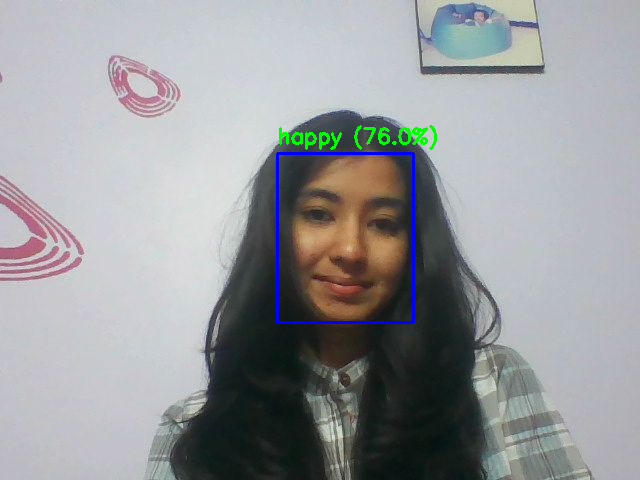

Detected Emotion: happy (Confidence: 76.0%)
Generating music for 'happy' emotion...


  self._interrupted_warning()



Playing music for 'happy' emotion...


✅ Model saved for future use!


In [ ]:
import cv2
import numpy as np
import base64
from IPython.display import display, Javascript, Audio
from google.colab.output import eval_js
from google.colab.patches import cv2_imshow
from fer import FER
import subprocess
import time
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import pretty_midi
import random
import os

# Import our LSTM Music Generator
from lstm_emotion_music import EmotionMusicGenerator

# JS code to capture image from webcam
def take_photo(filename='photo.jpg', quality=0.8):
    js = Javascript('''
        async function takePhoto(quality) {
          const div = document.createElement('div');
          const capture = document.createElement('button');
          capture.textContent = '📷 Capture';
          div.appendChild(capture);

          const video = document.createElement('video');
          video.style.display = 'block';
          const stream = await navigator.mediaDevices.getUserMedia({video: true});

          document.body.appendChild(div);
          div.appendChild(video);
          video.srcObject = stream;
          await video.play();

          // Resize camera to square
          google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

          await new Promise((resolve) => capture.onclick = resolve);

          const canvas = document.createElement('canvas');
          canvas.width = video.videoWidth;
          canvas.height = video.videoHeight;
          canvas.getContext('2d').drawImage(video, 0, 0);
          stream.getVideoTracks()[0].stop();
          div.remove();

          const dataUrl = canvas.toDataURL('image/jpeg', quality);
          return dataUrl;
        }
    ''')
    display(js)
    data = eval_js('takePhoto({})'.format(quality))
    binary = base64.b64decode(data.split(',')[1])

    with open(filename, 'wb') as f:
        f.write(binary)

    return filename

def detect_emotion(image_path):
    # Load image
    img = cv2.imread(image_path)

    # Detect emotion with FER
    detector = FER(mtcnn=True)
    result = detector.detect_emotions(img)

    # Draw bounding boxes and show emotions
    annotated_img = img.copy()
    for face in result:
        (x, y, w, h) = face["box"]
        emotions = face["emotions"]
        top_emotion = max(emotions, key=emotions.get)
        label = f"{top_emotion} ({emotions[top_emotion]*100:.1f}%)"
        cv2.rectangle(annotated_img, (x, y), (x+w, y+h), (255, 0, 0), 2)
        cv2.putText(annotated_img, label, (x, y-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

    # Display the image with annotations
    cv2_imshow(annotated_img)

    # Get top emotion
    top_emotion = detector.top_emotion(img)
    dominant_emotion = top_emotion[0] if top_emotion else "neutral"
    print(f"Detected Emotion: {dominant_emotion} (Confidence: {top_emotion[1]*100:.1f}%)")

    return dominant_emotion

def convert_midi_to_wav(midi_path, wav_path):
    """Convert MIDI to WAV using fluidsynth"""
    subprocess.run([
        "fluidsynth",
        "-ni",
        "/usr/share/sounds/sf2/FluidR3_GM.sf2",
        midi_path,
        "-F",
        wav_path,
        "-r",
        "44100"
    ])
    return wav_path

def main():
    print("🎵 Emotion-based Music Generator 🎵")
    print("-----------------------------------")
    print("Taking a photo to detect your emotion...")

    # Capture image
    image_path = take_photo()
    print("✅ Photo captured!")

    # Detect emotion
    emotion = detect_emotion(image_path)

    # Initialize music generator
    music_gen = EmotionMusicGenerator()

    # Generate music based on detected emotion
    print(f"Generating music for '{emotion}' emotion...")
    midi_path = music_gen.generate_music(
        emotion,
        output_path=f"{emotion}_music.mid",
        duration=30  # Generate 30 seconds of music
    )

    # Convert to WAV for playback
    wav_path = f"{emotion}_music.wav"
    convert_midi_to_wav(midi_path, wav_path)

    # Play the music
    print(f"Playing music for '{emotion}' emotion...")
    display(Audio(wav_path))

    # Save the model for future use
    music_gen.save_model()
    print("✅ Model saved for future use!")

if __name__ == "__main__":
    main()